### Authored by: YOGESH SAVIRIGANA

### Purpose of the Dataset

This data set is from the well-known UCI Machine Learning Repository. The objective of this notebook is to correctly forecast, based on the provided features, whether or not an adult earns more than $50,000 USD per year.


### About the Dataset

This data set is from the well-known UCI Machine Learning Repository. The objective of this notebook is to correctly forecast, based on the provided features, whether or not an adult earns more than $50,000 USD per year.

The data set selected is “Adult Census Income” attached is the link for easy reference – “https://www.kaggle.com/datasets/uciml/adult-census-income”

Age: Describes the age of individuals. Continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

fnlwgt: Continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool. education-num: Number of years spent in education. Continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces. relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: Continuous.

capital-loss: Continuous.

hours-per-week: Continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

salary: >50K,<=50K

### Step1: Import all required libraries

In [1]:
import pandas as pd
from sklearn import *
from sklearn.model_selection import train_test_split
from sklearn import preprocessing 
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.utils import resample
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score
import seaborn as sns

np.random.seed(1)



import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier

#from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn import preprocessing 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.tree import plot_tree

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

### Step2: Load the data, clean and prepare data for analysis

In [2]:
adult_df = pd.read_csv("C:/Users/yoges/OneDrive/Documents/Sem 1/ISM6163 - DM/project/Proj1/adult.csv") # change this path depending on where you store the file on your computer

In [3]:
adult_df.head(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
adult_df.shape

(32561, 15)

Checking the number of rows and columns in the data set selected

In [5]:
adult_df.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


Check column names, and for our convenience, let's remove whitespaces and '.' if any...

In [6]:
adult_df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

### Step3: Clean up Column names - Removing whitespaces and '.' and replacing it with '_' and converting them to uppercase headers in all columns

In [7]:
adult_df.columns = [s.strip().upper().replace('.', '_') for s in adult_df.columns] 
adult_df.columns = [s.strip().upper().replace(' ', '_') for s in adult_df.columns] 

In [8]:
adult_df.columns

Index(['AGE', 'WORKCLASS', 'FNLWGT', 'EDUCATION', 'EDUCATION_NUM',
       'MARITAL_STATUS', 'OCCUPATION', 'RELATIONSHIP', 'RACE', 'SEX',
       'CAPITAL_GAIN', 'CAPITAL_LOSS', 'HOURS_PER_WEEK', 'NATIVE_COUNTRY',
       'INCOME'],
      dtype='object')

#### Exploring the datatypes of all the variables

In [9]:
adult_df.dtypes

AGE                int64
WORKCLASS         object
FNLWGT             int64
EDUCATION         object
EDUCATION_NUM      int64
MARITAL_STATUS    object
OCCUPATION        object
RELATIONSHIP      object
RACE              object
SEX               object
CAPITAL_GAIN       int64
CAPITAL_LOSS       int64
HOURS_PER_WEEK     int64
NATIVE_COUNTRY    object
INCOME            object
dtype: object

#### We are now replacing all the 'object' datatypes to 'category' datatypes by converting them to categorical datatypes

In [10]:
adult_df.WORKCLASS = adult_df.WORKCLASS.astype('category')
adult_df.EDUCATION = adult_df.EDUCATION.astype('category')
adult_df.MARITAL_STATUS = adult_df.MARITAL_STATUS.astype('category')
adult_df.OCCUPATION = adult_df.OCCUPATION.astype('category')
adult_df.RELATIONSHIP = adult_df.RELATIONSHIP.astype('category')
adult_df.RACE = adult_df.RACE.astype('category')
adult_df.SEX = adult_df.SEX.astype('category')
adult_df.NATIVE_COUNTRY = adult_df.NATIVE_COUNTRY.astype('category')
adult_df.INCOME = adult_df.INCOME.astype('category')

#### Now we have converted all our 'object' datatypes to 'categorical' datatypes

In [11]:
adult_df.dtypes

AGE                  int64
WORKCLASS         category
FNLWGT               int64
EDUCATION         category
EDUCATION_NUM        int64
MARITAL_STATUS    category
OCCUPATION        category
RELATIONSHIP      category
RACE              category
SEX               category
CAPITAL_GAIN         int64
CAPITAL_LOSS         int64
HOURS_PER_WEEK       int64
NATIVE_COUNTRY    category
INCOME            category
dtype: object

### check for missing values

In [12]:
adult_df.isnull().sum()

AGE               0
WORKCLASS         0
FNLWGT            0
EDUCATION         0
EDUCATION_NUM     0
MARITAL_STATUS    0
OCCUPATION        0
RELATIONSHIP      0
RACE              0
SEX               0
CAPITAL_GAIN      0
CAPITAL_LOSS      0
HOURS_PER_WEEK    0
NATIVE_COUNTRY    0
INCOME            0
dtype: int64

#### Exploring All unique values of all the categorical variables using **unique()** 

In [13]:
print(adult_df['WORKCLASS'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['EDUCATION'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['MARITAL_STATUS'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['OCCUPATION'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['RELATIONSHIP'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['RACE'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['SEX'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['NATIVE_COUNTRY'].unique())
print('---------------------------------------------------------------------------------------------------------------------------')
print(adult_df['INCOME'].unique())

['?', 'Private', 'State-gov', 'Federal-gov', 'Self-emp-not-inc', 'Self-emp-inc', 'Local-gov', 'Without-pay', 'Never-worked']
Categories (9, object): ['?', 'Federal-gov', 'Local-gov', 'Never-worked', ..., 'Self-emp-inc', 'Self-emp-not-inc', 'State-gov', 'Without-pay']
---------------------------------------------------------------------------------------------------------------------------
['HS-grad', 'Some-college', '7th-8th', '10th', 'Doctorate', ..., '1st-4th', '5th-6th', '12th', '9th', 'Preschool']
Length: 16
Categories (16, object): ['10th', '11th', '12th', '1st-4th', ..., 'Masters', 'Preschool', 'Prof-school', 'Some-college']
---------------------------------------------------------------------------------------------------------------------------
['Widowed', 'Divorced', 'Separated', 'Never-married', 'Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse']
Categories (7, object): ['Divorced', 'Married-AF-spouse', 'Married-civ-spouse', 'Married-spouse-absent', 'Never-mar

#### We can clearly observe that some of the categorical variables (like 'WORKCLASS','NATIVE COUNTRY' and 'OCCUPATION' have '?' as unique value, which is replaced by value 'NaN' 

In [14]:
adult_df=adult_df.replace({'?': np.nan})
adult_df=adult_df.replace({' ': np.nan})

#### Checking whether all the '?' values are replaced with NaN values

In [15]:
print(adult_df['WORKCLASS'].unique())
print('--------------------------------------------------------------------------')
print(adult_df['OCCUPATION'].unique())
print('--------------------------------------------------------------------------')
print(adult_df['NATIVE_COUNTRY'].unique())

[NaN, 'Private', 'State-gov', 'Federal-gov', 'Self-emp-not-inc', 'Self-emp-inc', 'Local-gov', 'Without-pay', 'Never-worked']
Categories (8, object): ['Federal-gov', 'Local-gov', 'Never-worked', 'Private', 'Self-emp-inc', 'Self-emp-not-inc', 'State-gov', 'Without-pay']
--------------------------------------------------------------------------
[NaN, 'Exec-managerial', 'Machine-op-inspct', 'Prof-specialty', 'Other-service', ..., 'Farming-fishing', 'Tech-support', 'Protective-serv', 'Armed-Forces', 'Priv-house-serv']
Length: 15
Categories (14, object): ['Adm-clerical', 'Armed-Forces', 'Craft-repair', 'Exec-managerial', ..., 'Protective-serv', 'Sales', 'Tech-support', 'Transport-moving']
--------------------------------------------------------------------------
['United-States', NaN, 'Mexico', 'Greece', 'Vietnam', ..., 'Scotland', 'Portugal', 'Laos', 'Thailand', 'Outlying-US(Guam-USVI-etc)']
Length: 42
Categories (41, object): ['Cambodia', 'Canada', 'China', 'Columbia', ..., 'Trinadad&Tobag

In [16]:
adult_df.isnull().sum()

AGE                  0
WORKCLASS         1836
FNLWGT               0
EDUCATION            0
EDUCATION_NUM        0
MARITAL_STATUS       0
OCCUPATION        1843
RELATIONSHIP         0
RACE                 0
SEX                  0
CAPITAL_GAIN         0
CAPITAL_LOSS         0
HOURS_PER_WEEK       0
NATIVE_COUNTRY     583
INCOME               0
dtype: int64

#### Filling NaN values in 'WORKCLASS' variable with Most repeated element (MODE)

In [17]:
adult_df['WORKCLASS'].describe()

count       30725
unique          8
top       Private
freq        22696
Name: WORKCLASS, dtype: object

In [18]:
adult_df['WORKCLASS'] = adult_df['WORKCLASS'].fillna('Private')

#### Filling NaN values in 'OCCUPATION' variable with Most repeated element (MODE)

In [19]:
adult_df['OCCUPATION'].describe()

count              30718
unique                14
top       Prof-specialty
freq                4140
Name: OCCUPATION, dtype: object

In [20]:
adult_df['OCCUPATION'] = adult_df['OCCUPATION'].fillna('Prof-specialty')

#### Filling NaN values in 'NATIVE_COUNTRY' variable with Most repeated element (MODE)

In [21]:
adult_df.NATIVE_COUNTRY.describe()

count             31978
unique               41
top       United-States
freq              29170
Name: NATIVE_COUNTRY, dtype: object

In [22]:
adult_df['NATIVE_COUNTRY'] = adult_df['NATIVE_COUNTRY'].fillna('United-States')

In [23]:
adult_df.isnull().sum()

AGE               0
WORKCLASS         0
FNLWGT            0
EDUCATION         0
EDUCATION_NUM     0
MARITAL_STATUS    0
OCCUPATION        0
RELATIONSHIP      0
RACE              0
SEX               0
CAPITAL_GAIN      0
CAPITAL_LOSS      0
HOURS_PER_WEEK    0
NATIVE_COUNTRY    0
INCOME            0
dtype: int64

# Exploring Categorical Variables

**BAR PLOT FOR WORKCLASS**

Most of the adults prefer to work Private Organizations than working for any government or being self employed

<AxesSubplot:>

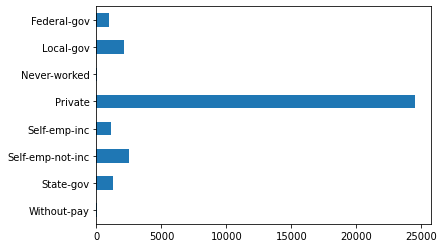

In [24]:
adult_df.WORKCLASS.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR EDUCATION**

Most of the adults have completed their High school graduation 

<AxesSubplot:>

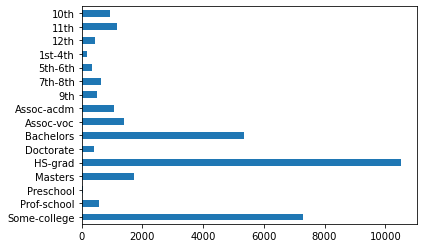

In [25]:
adult_df.EDUCATION.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR MARITAL STATUS**

Most of the adults are Married, followed by never married and divorced

<AxesSubplot:>

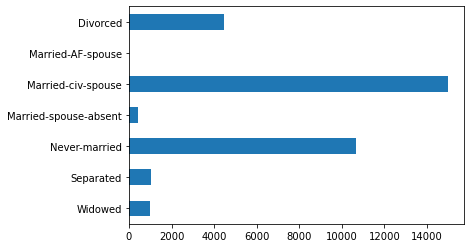

In [26]:
adult_df.MARITAL_STATUS.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR OCCUPATION**

Most of the adults occupation belong to Prof-Speciality group like (Engineers,Technologists,Therapits,Educators etc).

<AxesSubplot:>

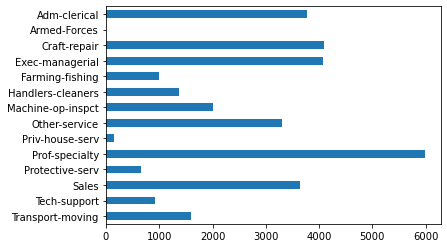

In [27]:
adult_df.OCCUPATION.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR RELATIONSHIP**

Most of the adults are Husband

<AxesSubplot:>

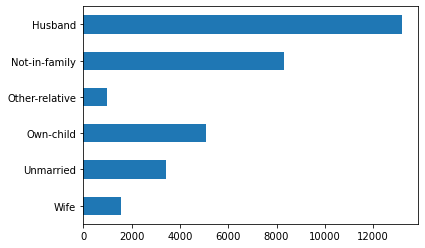

In [28]:
adult_df.RELATIONSHIP.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR RACE**

Most of the adults belong to White Race

<AxesSubplot:>

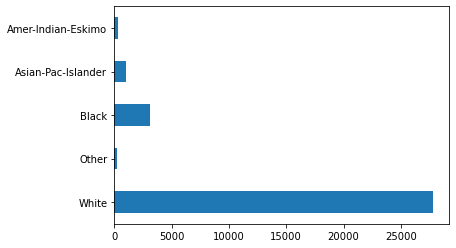

In [29]:
adult_df.RACE.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR SEX**

Most of the adults are Male

<AxesSubplot:>

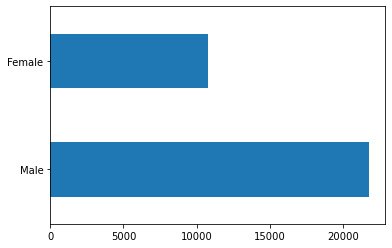

In [30]:
adult_df.SEX.value_counts().sort_index(ascending=False).plot(kind='barh')

**BAR PLOT FOR INCOME**

Most of the adults earn income <=50K$

<AxesSubplot:>

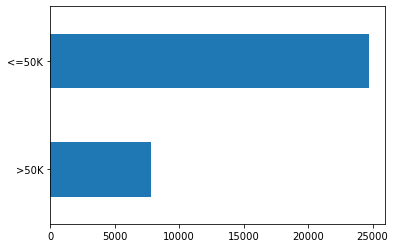

In [31]:
adult_df.INCOME.value_counts().sort_index(ascending=False).plot(kind='barh')

## Label Encoding

In [32]:
from sklearn.preprocessing import LabelEncoder

### Applying Label encoding to multiple columns 

In [33]:
categ = ['WORKCLASS','EDUCATION','MARITAL_STATUS', 'OCCUPATION', 'RELATIONSHIP', 'RACE', 'SEX','NATIVE_COUNTRY','INCOME']

# Encode Categorical Columns
enc = LabelEncoder()
adult_df[categ] = adult_df[categ].apply(enc.fit_transform)

In [34]:
adult_df.head(10)

,AGE,WORKCLASS,FNLWGT,EDUCATION,EDUCATION_NUM,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HOURS_PER_WEEK,NATIVE_COUNTRY,INCOME
0,90,3,77053,11,9,6,9,1,4,0,0,4356,40,38,0
1,82,3,132870,11,9,6,3,1,4,0,0,4356,18,38,0
2,66,3,186061,15,10,6,9,4,2,0,0,4356,40,38,0
3,54,3,140359,5,4,0,6,4,4,0,0,3900,40,38,0
4,41,3,264663,15,10,5,9,3,4,0,0,3900,40,38,0
5,34,3,216864,11,9,0,7,4,4,0,0,3770,45,38,0
6,38,3,150601,0,6,5,0,4,4,1,0,3770,40,38,0
7,74,6,88638,10,16,4,9,2,4,0,0,3683,20,38,1
8,68,0,422013,11,9,0,9,1,4,0,0,3683,40,38,0
9,41,3,70037,15,10,4,2,4,4,1,0,3004,60,38,1


## Addressing Data Imbalance

In [35]:
adult_df['INCOME'].value_counts()

0    24720
1     7841
Name: INCOME, dtype: int64

In [36]:
class_0 = adult_df[adult_df['INCOME']==0]
class_1 = adult_df[adult_df['INCOME']==1]

In [37]:
print(class_0.shape,class_1.shape)

(24720, 15) (7841, 15)


### Oversampling

In oversampling, minority class is oversampled at random or duplicate examples are added from the minority class (class1) inorder to match the majority class (class0)

Here the data points are selected randomly with replacement.

Now, we will be applying oversampling technique - one of the method to handle data imbalance in the data.

### Why to apply oversampling technique to our data ?

The ability of algorithm/model is always constrained by its ability to predict rare points.So in our problem, rare points are the class1 (where adult salary is >50K$).So we will be resampling the minority class1 datapoints to balance with the majority class(class0).

#### oversampling the minority data (class-1) to get more samples and make both class1 and class0 balanced

In [38]:
from sklearn.utils import resample

In [39]:
df_minority_upsampled = resample(class_1, 
                                 replace=True,     # sample with replacement
                                 n_samples=24720,    # to match majority class
                                 random_state=123) # reproducible results

After performing oversampling, we can now confirm from below that both class1 and class0 have same dimensions.

In [40]:
print(class_0.shape,df_minority_upsampled.shape)

(24720, 15) (24720, 15)


Here majority class has has 24720 rows in total and minority has 7841 rows

**Concatinating both Classes using concat()**

In [41]:
final_df = pd.concat([class_0,df_minority_upsampled])

In [42]:
print(final_df.shape)

(49440, 15)


#### Checking the correlation among all the variables wrt 'INCOME' variable which is our Target

We can observe that variables - WORKCLASS,FNLWGT,NATIVE_CLASS have least correlation almost equal to zero, hence these 3 variables can be removed in our further modelling

In [43]:
final_df.corr()

,AGE,WORKCLASS,FNLWGT,EDUCATION,EDUCATION_NUM,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HOURS_PER_WEEK,NATIVE_COUNTRY,INCOME
AGE,1.000000,0.038884,-0.071701,0.010933,0.078624,-0.251375,0.007038,-0.250678,0.043818,0.122164,0.088693,0.067441,0.056466,0.005114,0.283918
WORKCLASS,0.038884,1.000000,-0.026717,-0.000351,0.011712,-0.017240,0.018654,-0.046219,0.042992,0.062582,0.044981,0.018518,0.047535,-0.005186,0.000748
FNLWGT,-0.071701,-0.026717,1.000000,-0.016485,-0.035359,0.022945,0.002950,0.005456,-0.022443,0.020814,0.002870,-0.013769,-0.014337,-0.053125,-0.012177
EDUCATION,0.010933,-0.000351,-0.016485,1.000000,0.282366,-0.050613,-0.029834,-0.028107,0.018420,-0.002087,0.039448,0.016169,0.059058,0.060710,0.106916
EDUCATION_NUM,0.078624,0.011712,-0.035359,0.282366,1.000000,-0.092662,0.096025,-0.120804,0.035329,0.055544,0.139681,0.095220,0.167435,0.053983,0.383867
MARITAL_STATUS,-0.251375,-0.017240,0.022945,-0.050613,-0.092662,1.000000,0.026055,0.176919,-0.063482,-0.147717,-0.043685,-0.038548,-0.183518,-0.021642,-0.261650
OCCUPATION,0.007038,0.018654,0.002950,-0.029834,0.096025,0.026055,1.000000,-0.045370,0.002803,0.049494,0.024320,0.014487,0.001044,-0.001758,0.040854
RELATIONSHIP,-0.250678,-0.046219,0.005456,-0.028107,-0.120804,0.176919,-0.045370,1.000000,-0.106691,-0.662212,-0.057802,-0.064593,-0.268205,-0.018352,-0.293808
RACE,0.043818,0.042992,-0.022443,0.018420,0.035329,-0.063482,0.002803,-0.106691,1.000000,0.087941,0.013911,0.025334,0.046925,0.152471,0.095156
SEX,0.122164,0.062582,0.020814,-0.002087,0.055544,-0.147717,0.049494,-0.662212,0.087941,1.000000,0.052053,0.056134,0.249678,0.009746,0.272133


### Step5: Split Data

Split data into a 70/30 split.

In [44]:
train_df, validation_df = train_test_split(final_df, test_size=0.3, random_state=1)

In [45]:
train_df.head(3)

,AGE,WORKCLASS,FNLWGT,EDUCATION,EDUCATION_NUM,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HOURS_PER_WEEK,NATIVE_COUNTRY,INCOME
19351,48,3,141511,12,14,2,3,0,4,1,0,0,40,38,1
2968,67,3,157403,14,15,2,9,0,4,1,6418,0,10,38,1
19454,17,3,158704,0,6,4,11,3,4,1,0,0,20,38,0


In [46]:
validation_df.head(2)

,AGE,WORKCLASS,FNLWGT,EDUCATION,EDUCATION_NUM,MARITAL_STATUS,OCCUPATION,RELATIONSHIP,RACE,SEX,CAPITAL_GAIN,CAPITAL_LOSS,HOURS_PER_WEEK,NATIVE_COUNTRY,INCOME
5728,30,3,117963,9,13,2,0,0,4,1,0,0,40,38,1
1448,33,3,213002,9,13,4,9,1,4,1,0,1408,36,38,0


### Transform Predictors¶

K-nn models are sensitive to differences in scale; therefore, we should begin by eliminating any differences in scale between the predictors/features. To accomplish this, we will standardize the values of each variable.

We will use the popular sklearn library's 'standard scaler' to accomplish this. This library contains many of the common functions we require when conducting analytics. The standard scaler function will standardize our variables. To achieve this, we will first need to train the scaler on the training data and then apply this trained scaler to standardize both the training and validation sets.

In [47]:
target = 'INCOME'
predictors = ['AGE','EDUCATION','EDUCATION_NUM','MARITAL_STATUS','OCCUPATION','RELATIONSHIP','RACE','SEX','CAPITAL_GAIN','CAPITAL_LOSS','HOURS_PER_WEEK']

predictors = list(final_df.columns)
predictors.remove(target)

# create a standard scaler and fit it to the training set of predictors
scaler = preprocessing.StandardScaler()
scaler.fit(train_df[predictors])

# Transform the predictors of training and validation sets
train_predictors = scaler.transform(train_df[predictors]) # train_predictors is not a numpy array
train_target = train_df[target] # train_target is now a series object

validation_predictors = scaler.transform(validation_df[predictors]) # validation_target is now a series object
validation_target = validation_df[target] # validation_target is now a series object

print(validation_predictors)

[[-0.80636472 -0.08448584 -0.68507342 ... -0.26387191 -0.18111746
   0.25064959]
 [-0.57393697 -0.08448584  0.22364361 ...  2.60503239 -0.51111368
   0.25064959]
 [ 0.35577403 -0.08448584 -0.46801742 ... -0.26387191  1.05636836
   0.25064959]
 ...
 [-0.65141289  2.49389689 -0.93329041 ... -0.26387191 -0.18111746
   0.25064959]
 [ 1.44043686 -2.66286858  0.99783009 ... -0.26387191 -0.18111746
   0.25064959]
 [ 0.58820178  0.77497507 -0.04370597 ... -0.26387191  0.64387309
   0.25064959]]


Let's now explore the results of the standardization

In [48]:
import numpy as np

print(train_predictors[:5], end="\n\n")
print(np.array(train_target[:5]), end="\n\n")
print(validation_predictors[:5], end="\n\n")
print(np.array(validation_target[:5]), end="\n\n")

[[ 0.58820178 -0.08448584 -0.45991882  0.41937734  1.30142153 -0.31508472
  -0.81316965 -0.73154372  0.35981404  0.59822129 -0.19698596 -0.26387191
  -0.18111746  0.25064959]
 [ 2.0602442  -0.08448584 -0.30796719  0.98148151  1.68373185 -0.31508472
   0.69694126 -0.73154372  0.35981404  0.59822129  0.42248665 -0.26387191
  -2.65608911  0.25064959]
 [-1.81355164 -0.08448584 -0.29552765 -2.95324772 -1.75706101  1.18164878
   1.20031157  1.11333459  0.35981404  0.59822129 -0.19698596 -0.26387191
  -1.83109856  0.25064959]
 [ 1.36296095  1.63443598  0.13777162  0.13832525 -0.61013006  2.67838228
  -0.81316965 -0.11658428  0.35981404  0.59822129 -0.19698596 -0.26387191
   0.64387309  0.25064959]
 [-0.80636472 -0.08448584 -0.26578177  1.2625336  -0.22781974 -1.81181822
   0.19357096  1.72829402  0.35981404 -1.67162221 -0.19698596 -0.26387191
  -0.59361274  0.25064959]]

[1 1 0 0 0]

[[-0.80636472 -0.08448584 -0.68507342 -0.42377893  0.91911121 -0.31508472
  -1.56822511 -0.73154372  0.3598140

### Step6: Train a K-NN model

To determine a k value we need to perform square root of the total observations. Since there are 32561 observations, following this rule of thumb, we would select a k value of 180 (but it's best to choose an odd number so that we will use k=181).

In [49]:
knn = KNeighborsClassifier(n_neighbors=181,  metric='euclidean') # user euclidean distance
knn.fit(train_predictors, train_target)
knn_prediction_output = knn.predict(validation_predictors)
knn_prediction_output[:100]

array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0])

In [50]:
knn_predict_proba_output = knn.predict_proba(validation_predictors)
knn_predict_proba_output[:100, 1].round(2)

array([0.75, 0.79, 0.71, 0.92, 0.69, 0.48, 0.69, 0.61, 0.91, 0.7 , 0.04,
       0.03, 0.93, 1.  , 0.28, 0.68, 0.02, 0.77, 0.46, 0.94, 0.19, 0.01,
       0.88, 0.84, 0.57, 0.83, 0.73, 0.7 , 0.25, 0.86, 0.06, 0.48, 0.76,
       0.66, 0.7 , 0.8 , 0.66, 0.56, 0.06, 0.27, 0.65, 0.62, 0.64, 0.37,
       0.  , 0.  , 0.01, 0.56, 0.98, 0.72, 0.34, 0.15, 0.66, 0.64, 0.54,
       0.13, 0.02, 0.09, 0.3 , 0.14, 0.68, 0.52, 0.55, 0.29, 0.45, 0.64,
       0.78, 0.35, 0.61, 0.71, 0.39, 0.6 , 0.52, 0.  , 0.35, 0.49, 0.63,
       0.  , 0.86, 0.75, 0.7 , 0.39, 0.  , 1.  , 0.36, 0.64, 0.86, 0.81,
       0.16, 0.43, 0.66, 0.41, 0.83, 0.78, 0.68, 0.56, 0.3 , 0.17, 0.83,
       0.45])

### Measure performance of model using confusion matrix

In [51]:
confusion = confusion_matrix(validation_target, knn_prediction_output)

In [52]:
confusion

array([[5534, 1982],
       [ 997, 6319]], dtype=int64)

**TRUE POSITIVE:** Adults whose salary>50K and model actually predicted as salary>50K$ ie 6289

**TRUE NEGATIVE:** Adults whose salary>50K but model not predicted as salary>50K$ ie 5548

**FALSE POSITIVE:** Adults whose salary is not greater than 50K and model actually predicted as salary>50K$ ie 1968

**FALSE NEGATIVE:** Adults whose salary>50K and model actually predicted as not-greater than 50k$ ie 1027

In [53]:
TP = confusion[1, 1] # True Positives 
TN = confusion[0, 0] # True Negatives
FP = confusion[0, 1] # False Positives 
FN = confusion[1, 0] # False Negatives

In [54]:
classification_accuracy = (TP + TN) / (TP + TN + FP + FN)
print(f"{classification_accuracy:.4f}")

0.7992


The model that we have created has a correctness/accuracy of 79.92 % which seems to be a good fit.

In [55]:
classification_error = (FP + FN) / (TP + TN + FP + FN)
# this is the same as ...
# classification_error = 1-classification_accuracy

print(f"{classification_error:.4f}")

0.2008


The KNN model which we have created generates a random error of 20.08%.

In [56]:
precision = TP / (TP + FP)
print(f"{precision:.4f}")

0.7612


This model has a 76.12% precision when predicting class 1 ( Adults whose sal earnings > 50K$

In [57]:
recall = TP / (TP + FN)
print(f"{recall:.4f}")

0.8637


The recall value of this model is 0.8637 which tells us that it has great ability of a classification model to identify all relevant instances.  

In [58]:
f1_Score = (2 * precision * recall) / (precision + recall)
print(f"{f1_Score:.4f}")

0.8092


The F1 score is defined as weighted average of both precision and recall. how accurate our model is by measuring the harmonic mean of Precision and Recall.
Based on the above F1 score of 80.92%,

#### At k=3, we get max accuracy and recall values. So we choose k=3 as best k value for our KNN model

In [59]:
for i in range(1,21,2):
    knn = KNeighborsClassifier(n_neighbors=i,  metric='euclidean')
    knn.fit(train_predictors, train_target)
    knn_prediction_output = knn.predict(validation_predictors)
    accuracy = accuracy_score(validation_target,knn_prediction_output) * float(100)
    f1score = f1_score(validation_target,knn_prediction_output) * float(100)
    print('\n Accuracy for k = %d is %d %%' %(i,accuracy))
    print('\n F1 Score for k = %d is %d %%' %(i,f1score))
    print('-------------------------------------------------------------------------------------------------')


 Accuracy for k = 1 is 90 %

 F1 Score for k = 1 is 90 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 3 is 85 %

 F1 Score for k = 3 is 86 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 5 is 83 %

 F1 Score for k = 5 is 84 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 7 is 82 %

 F1 Score for k = 7 is 83 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 9 is 82 %

 F1 Score for k = 9 is 82 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 11 is 82 %

 F1 Score for k = 11 is 82 %
-------------------------------------------------------------------------------------------------

 Accuracy for k = 13 is 82 %

 F1 Score for k = 13 is 82 %
--

### Step7: Hyperparamater Tuning with k-NN

Hyper parameter tuning is not limited to decision trees, we can apply it to k-NN modeling technqiue for which we'd like to explore different parameter values and the resulting performance of the model with these parameters.

Let's check the performance of a few k-NN values manually.

In [60]:
# train model k=1
knn1 = KNeighborsClassifier(n_neighbors=1)
knn1.fit(train_predictors, train_target)
print("**** 1-NN model")
print("Accuracy score:", accuracy_score(validation_target, knn1.predict(validation_predictors)))
print("Precision score:", precision_score(validation_target, knn1.predict(validation_predictors)))
print("Recall score:", recall_score(validation_target, knn1.predict(validation_predictors)))


# train model k=3
knn3 = KNeighborsClassifier(n_neighbors=3)
knn3.fit(train_predictors, train_target)
print("**** 3-NN model")
print("Accuracy score:", accuracy_score(validation_target, knn3.predict(validation_predictors)))
print("Precision score:", precision_score(validation_target, knn3.predict(validation_predictors)))
print("Recall score:", recall_score(validation_target, knn3.predict(validation_predictors)))

# train model k=5
knn5 = KNeighborsClassifier(n_neighbors=5)
knn5.fit(train_predictors, train_target)
accuracy_score(validation_target, knn5.predict(validation_predictors))
print("**** 5-NN model")
print("Accuracy score:", accuracy_score(validation_target, knn5.predict(validation_predictors)))
print("Precision score:", precision_score(validation_target, knn5.predict(validation_predictors)))
print("Recall score:", recall_score(validation_target, knn5.predict(validation_predictors)))

**** 1-NN model
Accuracy score: 0.9019687162891047
Precision score: 0.8614056720098644
Recall score: 0.9548933843630399
**** 3-NN model
Accuracy score: 0.8541666666666666
Precision score: 0.8104590914568021
Recall score: 0.9193548387096774
**** 5-NN model
Accuracy score: 0.8325242718446602
Precision score: 0.7942752740560293
Recall score: 0.8913340623291416


In [61]:
score_measure = 'accuracy'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'n_neighbors': list(range(1,17,2)),
    'metric': ['euclidean', 'cosine']
}
gridSearch = GridSearchCV(KNeighborsClassifier(), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

bestAccuracyKnn = gridSearch.best_estimator_

C:\Users\yoges\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [0.89493745 0.8444868  0.82772781 0.82189099 0.81848146 0.81648736
 0.81510043 0.81614049        nan        nan        nan        nan
        nan        nan        nan        nan]
  warnings.warn(


accuracy score:  0.8949374533405262
parameters:  {'metric': 'euclidean', 'n_neighbors': 1}


In [62]:
score_measure = 'precision'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'n_neighbors': list(range(1,21,2)),
    'metric': ['euclidean', 'cosine']
}
gridSearch = GridSearchCV(KNeighborsClassifier(), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

bestPrecisionKnn = gridSearch.best_estimator_

C:\Users\yoges\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [0.85797861 0.80697712 0.79554251 0.79265124 0.79110886 0.78937179
 0.78885932 0.78903558 0.78717922 0.7852013         nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
  warnings.warn(


precision score:  0.857978612580086
parameters:  {'metric': 'euclidean', 'n_neighbors': 1}


In [63]:
score_measure = 'recall'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'n_neighbors': list(range(1,21,2)),
    'metric': ['euclidean', 'cosine']    
}
gridSearch = GridSearchCV(KNeighborsClassifier(), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)


bestRecallKnn = gridSearch.best_estimator_

C:\Users\yoges\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [0.94811563 0.90812424 0.88514099 0.87479814 0.86847865 0.86629503
 0.86353701 0.86600738 0.86416939 0.86267507        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
  warnings.warn(


recall score:  0.948115629146943
parameters:  {'metric': 'euclidean', 'n_neighbors': 1}


### Decision Tree Classifier

In [64]:
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier(random_state=1)

In [65]:
target = 'INCOME'
predictors = ['AGE','EDUCATION','EDUCATION_NUM','MARITAL_STATUS','OCCUPATION','RELATIONSHIP','RACE','SEX','CAPITAL_GAIN','CAPITAL_LOSS','HOURS_PER_WEEK','NATIVE_COUNTRY']
X = final_df[predictors]
y = final_df[target]

Fitting the model

In [66]:
dtree.fit(train_predictors, train_target)
dtree_prediction_output = dtree.predict(validation_predictors)
dtree_prediction_output[:100]

array([1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1])

In [67]:
unique, counts = np.unique(dtree_prediction_output, return_counts=True)
dict(zip(unique, counts))

{0: 6690, 1: 8142}

The above output means that we found 8142 of the 14832 observations in the validation set to be likely to have income more than 50K.

In [68]:
confusion = confusion_matrix(validation_target, dtree_prediction_output)

In [69]:
confusion

array([[6425, 1091],
       [ 265, 7051]], dtype=int64)

**TRUE POSITIVE:** Adults whose salary>50K and model actually predicted as salary>50K$ ie 7051

**TRUE NEGATIVE:** Adults whose salary>50K but model not predicted as salary>50K$ ie 6425

**FALSE POSITIVE:** Adults whose salary is not greater than 50K and model actually predicted as salary>50K$ ie 1091

**FALSE NEGATIVE:** Adults whose salary>50K and model actually predicted as not-greater than 50k$ ie 265

In [70]:
print('Accuracy score:\n', accuracy_score(validation_target, dtree_prediction_output))

Accuracy score:
 0.9085760517799353


In [71]:
print('Precision score:\n', precision_score(validation_target, dtree_prediction_output))

Precision score:
 0.8660034389584869


In [72]:
print('Recall score:\n', recall_score(validation_target, dtree_prediction_output))

Recall score:
 0.9637780207763805


In [73]:
print('F1 score:\n', f1_score(validation_target, dtree_prediction_output))

F1 score:
 0.9122784318799326


### Visualizing a Decision Tree As A Plot

In [74]:
fig = plt.figure(figsize=(60,30), dpi=300)
_ = plot_tree(dtree, 
                feature_names=adult_df.columns,  
                class_names=['<=50K', '>50K'],
                filled=True,
                fontsize=8
             )

In [75]:
from sklearn.tree import export_text

text_representation = export_text(dtree)

print(text_representation)

|--- feature_7 <= -0.42
|   |--- feature_4 <= -0.42
|   |   |--- feature_10 <= 0.29
|   |   |   |--- feature_4 <= -1.18
|   |   |   |   |--- feature_12 <= 0.27
|   |   |   |   |   |--- feature_11 <= 3.39
|   |   |   |   |   |   |--- feature_13 <= -0.17
|   |   |   |   |   |   |   |--- feature_0 <= 1.01
|   |   |   |   |   |   |   |   |--- feature_2 <= 0.90
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_2 >  0.90
|   |   |   |   |   |   |   |   |   |--- feature_2 <= 0.93
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- feature_2 >  0.93
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_0 >  1.01
|   |   |   |   |   |   |   |   |--- feature_3 <= -2.53
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_3 >  -2.53
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 1.09
|   |   |   |   |   |   |   |   |   | 

In [76]:
print(f"Accuracy=", accuracy_score(train_target, dtree.predict(train_predictors)))
print(f"Precision=", precision_score(train_target, dtree.predict(train_predictors)))
print(f"Recall=", recall_score(train_target, dtree.predict(train_predictors)))
print(f"f1=", f1_score(train_target, dtree.predict(train_predictors)))

Accuracy= 0.9999711049468331
Precision= 0.9999425452456191
Recall= 1.0
f1= 0.9999712717975235


In [77]:
print(f"Accuracy=", accuracy_score(validation_target, dtree.predict(validation_predictors)))
print(f"Precision=", precision_score(validation_target, dtree.predict(validation_predictors)))
print(f"Recall=", recall_score(validation_target, dtree.predict(validation_predictors)))      
print(f"f1=", f1_score(validation_target, dtree.predict(validation_predictors)))

Accuracy= 0.9085760517799353
Precision= 0.8660034389584869
Recall= 0.9637780207763805
f1= 0.9122784318799326


In [78]:
print(classification_report(validation_target, dtree.predict(validation_predictors), target_names=['<=50K', '>50K']))

              precision    recall  f1-score   support

       <=50K       0.96      0.85      0.90      7516
        >50K       0.87      0.96      0.91      7316

    accuracy                           0.91     14832
   macro avg       0.91      0.91      0.91     14832
weighted avg       0.91      0.91      0.91     14832



## Hyperparameter Tuning Decision Tree


Here we are tuning a decision tree model, where we are testing the parameter valuessuch as 'max_depth','min_samples_split','min_impurity_decrease'.


In [79]:
score_measure = 'precision'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [2, 5, 10, 20, 30, 40], 
    'min_samples_split': [2, 5, 10, 20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

bestPrecisionTree = gridSearch.best_estimator_


precision score:  0.8617127169998844
parameters:  {'max_depth': 40, 'min_impurity_decrease': 0, 'min_samples_split': 2}


In [80]:
score_measure = 'recall'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [2, 5, 10, 20, 30, 40], 
    'min_samples_split': [2, 5, 10, 20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

bestRecallTree = gridSearch.best_estimator_

recall score:  0.955470234440505
parameters:  {'max_depth': 40, 'min_impurity_decrease': 0, 'min_samples_split': 2}


In [81]:
score_measure = 'accuracy'
k_fold = 10
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [2, 5, 10, 20, 30, 40], 
    'min_samples_split': [2, 5, 10, 20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=k_fold, scoring=score_measure,
                          n_jobs=-1)  # n_jobs=-1 will utilize all available CPUs 
gridSearch.fit(train_predictors, train_target)
print(score_measure, 'score: ', gridSearch.best_score_)
print('parameters: ', gridSearch.best_params_)

bestAccuracyTree = gridSearch.best_estimator_

accuracy score:  0.9004562315345392
parameters:  {'max_depth': 40, 'min_impurity_decrease': 0, 'min_samples_split': 2}


In [82]:
print("*****************")
print("Best Accuracy Tree")
print(classification_report(validation_target, bestAccuracyTree.predict(validation_predictors)))
print("*****************")
print("Best Recall Tree")
print(classification_report(validation_target, bestPrecisionTree.predict(validation_predictors)))
print("*****************")
print("Best Recall Tree")
print(classification_report(validation_target, bestRecallTree.predict(validation_predictors)))

*****************
Best Accuracy Tree
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      7516
           1       0.87      0.96      0.91      7316

    accuracy                           0.91     14832
   macro avg       0.91      0.91      0.91     14832
weighted avg       0.91      0.91      0.91     14832

*****************
Best Recall Tree
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      7516
           1       0.87      0.96      0.91      7316

    accuracy                           0.91     14832
   macro avg       0.91      0.91      0.91     14832
weighted avg       0.91      0.91      0.91     14832

*****************
Best Recall Tree
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      7516
           1       0.87      0.96      0.91      7316

    accuracy                           0.91     14832
   macro avg       0.

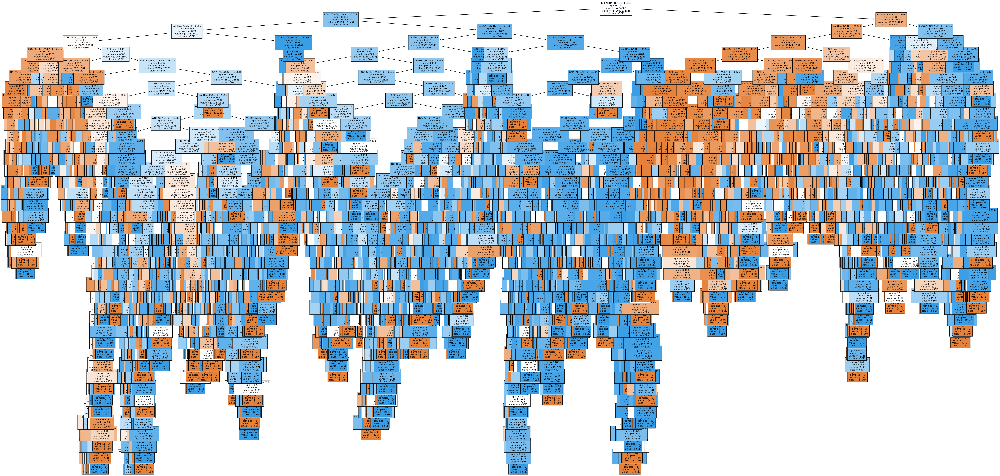

In [83]:
#plotDecisionTree(bestAccuracyTree, feature_names=train_X.columns)

fig = plt.figure(figsize=(60,30), dpi=180)
_ = plot_tree(bestAccuracyTree, 
                feature_names=adult_df.columns,  
                class_names=['<=50K', '>50K'],
                filled=True,
                fontsize=8
             )